In [1]:
!pip install git+https://github.com/pswpswpsw/nif.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/pswpswpsw/nif.git to /tmp/pip-req-build-jelnq2co
  Running command git clone -q https://github.com/pswpswpsw/nif.git /tmp/pip-req-build-jelnq2co
     |████████████████████████████████| 237 kB 13.3 MB/s 
  Created wheel for NIF: filename=NIF-1.0.1-py3-none-any.whl size=2945744 sha256=bf94c93727817230a88b246bd4a4bc00c27c29b62dc29029b814c7ad6a4011cf
  Stored in directory: /tmp/pip-ephem-wheel-cache-yxj3usuw/wheels/88/ba/9a/716e4d26db4b1364836a1dd0bfa96bb8d89b1e67736b0da3fb
Successfully built NIF


In [2]:
import tensorflow as tf
import nif
import numpy as np
import time
import logging
import contextlib
from matplotlib import pyplot as plt
from mpl_toolkits import mplot3d

1 Physical GPUs, 1 Logical GPUs


# Recall

- Previously we have a challenge in [Tutorial 6](https://colab.research.google.com/github/pswpswpsw/nif/blob/master/tutorial/6_revisit_multi_scale_NIF_with_L1_L2_regularization.ipynb): we get spurious signals when we sample the signal on a finer grid. We tried standard regularization but it does not work.

- How about Sobolov training? - not just fit the value but also the derivative

# Take home message

- Sobolov training works for reducing the effect of spurious waves happened in super-resolution

# What you will learn

- how to perform Sobolov training with just a few lines of code


## First, let's recall our example

Text(0.5, 0, '$u$')

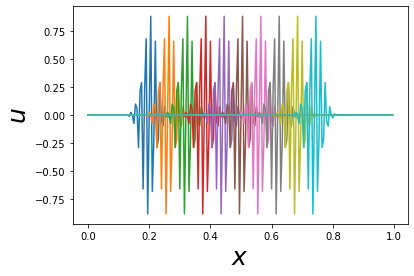

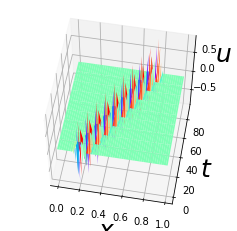

In [3]:
NT=10 # 20
NX=200

x = np.linspace(0,1,NX,endpoint=False)
t = np.linspace(0,100,NT,endpoint=False)

xx,tt=np.meshgrid(x,t)

omega = 400
c = 0.12/20
x0 = 0.2

u = np.exp(-1000*(xx-x0-c*tt)**2)*np.sin(omega*(xx-x0-c*tt))

# vis
plt.figure()
for i in range(NT):
    plt.plot(x,u[i,:],'-',label=str(i) + '-th time')

plt.xlabel('$x$',fontsize=25)
plt.ylabel('$u$',fontsize=25)


# vis iso
plt.figure(figsize=(4,4))
ax = plt.axes(projection='3d')
ax.plot_surface(xx,tt,u,cmap="rainbow", lw=2)#,rstride=1, cstride=1)
ax.view_init(57, -80)
ax.set_xlabel(r'$x$',fontsize=25)
ax.set_ylabel(r'$t$',fontsize=25)
ax.set_zlabel(r'$u$',fontsize=25)

## Next, we get the ground true derivatives

In [4]:
## get derivative data

dudx = np.exp(-1000*(xx-x0-c*tt)**2)*(-2000*(xx-x0-c*tt)*np.sin(omega*(xx-x0-c*tt)) + 
                                      omega*np.cos(omega*(xx-x0-c*tt)))

dudt = np.exp(-1000*(xx-x0-c*tt)**2)*(2000*c*(xx-x0-c*tt)* np.sin(omega*(xx-x0-c*tt)) - 
                                      omega*c* np.cos(omega*(xx-x0-c*tt)))


dudx_1d = dudx.reshape(-1,1)
dudt_1d = dudt.reshape(-1,1)

# Setup for NIF with SIREN

In [ ]:
cfg_shape_net = {
    "use_resblock":False,
    "connectivity": 'full',
    "input_dim": 1,
    "output_dim": 1,
    "units": 30,
    "nlayers": 2,
    "weight_init_factor": 0.01,
    "omega_0":30.0
}
cfg_parameter_net = {
    "use_resblock":False,
    "input_dim": 1,
    "latent_dim": 1,
    "units": 30,
    "nlayers": 2,
    "activation": 'swish'
}

enable_multi_gpu = False
enable_mixed_precision = False
nepoch = 50000
lr = 1e-4
batch_size = 512
checkpt_epoch = 1000
display_epoch = 100
print_figure_epoch = 100

### Here, we will use the following loss function

$$
\mathcal{L} = \mathcal{L}_{mse} + \alpha \mathcal{L}_{mse, derivative} = \frac{1}{M} \sum_i (u(x_i,y_i) - u_{NN}(x_i,y_i;\theta))^2 + \alpha  \frac{1}{M} \sum_i (\frac{\partial u}{\partial x}(x_i,y_i) - \frac{\partial u_{NN}}{\partial x}(x_i,y_i;\theta))^2
$$

then we use Adam optimizer to find $\min_{\theta} \mathcal{L}$

We empirically choose $\alpha=10^{-4}$. Intuitively, this number is related to when will the optimizer turns its attention to minimize $\mathcal{L}_{mse, derivative}$

In [ ]:
coef_grad = 1e-4

### get training data set

In [ ]:
from nif.demo import TravelingWaveHighFreq
tw = TravelingWaveHighFreq()

# no augment 
train_data_ng = tw.data
train_mean_ng = tw.mean
train_std_ng = tw.std

### Factor correction for the derivative

- Note that we normalised both coordinate $x$ and output $u$, so the derivative needs a factor correction

- Let's denote $\tilde{x}$ and $\tilde{u}$ as normalized version of $x$ and $u$. 
- Then we have
$$
\partial{\tilde{u}}/\partial{\tilde{x}} = \frac{\partial{{u}}/\partial{{x}}}{\sigma_u/\sigma_x}
$$
where $\sigma_u$ and $\sigma_x$ are the denominators for $\tilde{u}$ and $\tilde{x}$.

### Now, we augment the original dataset with derivative information

In [5]:
train_data = np.hstack([tw.data, dudt_1d/(tw.std[2]/tw.std[0]), dudx_1d/(tw.std[2]/tw.std[1])])

train_mean = np.hstack([tw.mean,0,0])
train_std = np.hstack([tw.std, tw.std[2]/tw.std[0], tw.std[2]/tw.std[1]])

In [6]:
num_total_data = train_data.shape[0]

# train_dataset_ng = tf.data.Dataset.from_tensor_slices((train_data_ng[:, :2], train_data_ng[:, 2:3]))
# train_dataset_ng = train_dataset_ng.shuffle(num_total_data).batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

train_dataset = tf.data.Dataset.from_tensor_slices((train_data[:, :2], train_data[:, 2:5]))
train_dataset = train_dataset.shuffle(num_total_data).batch(batch_size).prefetch(tf.data.experimental.AUTOTUNE)

# mixed precision?
if enable_mixed_precision:
    mixed_policy = "mixed_float16"
    # we might need this for `model.fit` to automatically do loss scaling
    policy = nif.mixed_precision.Policy(mixed_policy)
    nif.mixed_precision.set_global_policy(policy)
else:
    mixed_policy = 'float32'
class LossAndErrorPrintingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.train_begin_time = time.time()
        self.history_loss = []
        logging.basicConfig(filename='./log', level=logging.INFO, format='%(message)s')

    def on_epoch_begin(self, epoch, logs=None):
        self.ts = time.time()

    def on_epoch_end(self, epoch, logs=None):
        if epoch % display_epoch == 0:
            tnow = time.time()
            te = tnow - self.ts
            logging.info("Epoch {:6d}: avg.loss pe = {:4.3e}, {:d} points/sec, time elapsed = {:4.3f} hours".format(
                epoch, logs['loss'], int(batch_size / te), (tnow - self.train_begin_time) / 3600.0))
            self.history_loss.append(logs['loss'])
        if epoch % print_figure_epoch == 0:
            plt.figure()
            plt.semilogy(self.history_loss)
            plt.xlabel('epoch: per {} epochs'.format(print_figure_epoch))
            plt.ylabel('MSE loss')
            plt.savefig('./loss.png')
            plt.close()

            u_pred = self.model.predict(train_data[:,:2])[:,0].reshape(10,200)
            fig,axs=plt.subplots(1,3,figsize=(16,4))
            im1=axs[0].contourf(tt, xx, train_data[:,2].reshape(10,200),vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im1,ax=axs[0])

            im2=axs[1].contourf(tt, xx, u_pred,vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im2,ax=axs[1])

            im3=axs[2].contourf(tt, xx, (u_pred-train_data[:,2].reshape(10,200)),vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im3,ax=axs[2])

            axs[0].set_xlabel('t')
            axs[0].set_ylabel('x')
            axs[0].set_title('true')
            axs[1].set_title('pred')
            axs[2].set_title('error')
            plt.savefig('vis.png')
            plt.close()

        if epoch % checkpt_epoch == 0 or epoch == nepoch - 1:
            print('save checkpoint epoch: %d...' % epoch)
            self.model.save_weights("./saved_weights/ckpt-{}/ckpt".format(epoch))
def scheduler(epoch, lr):
    # if epoch < 1000:
    #     return lr
    # elif epoch < 2000:
    #     return 5e-4
    # elif epoch < 4000:
    #     return 1e-4
    # else:
    #     return 5e-4
    return lr

scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

### We open up a tensorboard to monitor the error

We will monitor
- total loss
- loss in du/dt
- loss in du/dx

In [7]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./tb-logs/with-grad", update_freq='epoch')
%load_ext tensorboard
%tensorboard --logdir ./tb-logs/

Output hidden; open in https://colab.research.google.com to view.

### Use of `JacobianLayer`

- We use just a few lines of codes in the below to implement Sobolov training
- We only regularize the spatial smoothness of the solution using du/dx. Since we are more interested in super-resolution in space in this case.
- We also observe du/dt just to show that the **du/dt from trained NN is not trustworthy at all** if you don't supervise it to learn.

In [8]:

cm = tf.distribute.MirroredStrategy().scope() if enable_multi_gpu else contextlib.nullcontext()
with cm:
    optimizer = tf.keras.optimizers.Adam(lr)
    model_ori = nif.NIFMultiScale(cfg_shape_net, cfg_parameter_net, mixed_policy)
    model_opt = model_ori.build()
    
    # sobolov training
    x_index = [0, 1]  # t,x
    y_index = [0]  # we have 1 field output - u
    
    from nif.layers import JacobianLayer

    n_output = 1

    y_and_dydx = JacobianLayer(model_opt, y_index, x_index)
    y, dy_dx = y_and_dydx(model_opt.inputs[0])  ##  use[0] to make sure shape is good
    dy_dx_1d = tf.reshape(dy_dx, [-1,2*n_output])
    y_and_dydx_1d = tf.concat([y, dy_dx_1d],-1)
    model_opt = tf.keras.Model([model_opt.inputs[0]], [y_and_dydx_1d])

    class Sobolov_MSE(tf.keras.losses.Loss):
        def call(self, y_true, y_pred):
            sd_field = tf.square(y_true[:, :n_output] - y_pred[:, :n_output])
            # sd_grad = tf.square(y_true[:, n_output:] - y_pred[:, n_output:])
            sd_grad =  tf.square(y_true[:, n_output+1:] - y_pred[:, n_output+1:])
            return tf.reduce_mean(sd_field,axis=-1) + coef_grad*tf.reduce_mean(sd_grad,axis=-1)

    def Sobolov_MSE_u(y_true, y_pred):
        sd_field = tf.square(y_true[:, :n_output] - y_pred[:, :n_output])
        return tf.reduce_mean(sd_field,axis=-1)

    def Sobolov_MSE_dudt(y_true, y_pred):
        sd_grad = tf.square(y_true[:, n_output:n_output+1] - y_pred[:, n_output:n_output+1])
        return coef_grad*tf.reduce_mean(sd_grad,axis=-1)

    def Sobolov_MSE_dudx(y_true, y_pred):
        sd_grad = tf.square(y_true[:, n_output+1:] - y_pred[:, n_output+1:])
        return coef_grad*tf.reduce_mean(sd_grad,axis=-1)
    
    model_opt.compile(optimizer, loss=Sobolov_MSE(), 
                      metrics=[Sobolov_MSE_u, Sobolov_MSE_dudt, Sobolov_MSE_dudx])
    
# callbacks = []
# callbacks = [LossAndErrorPrintingCallback(), scheduler_callback]
# callbacks = [tensorboard_callback, ]
callbacks = [tensorboard_callback, LossAndErrorPrintingCallback(), scheduler_callback]
model_opt.fit(train_dataset,  verbose=0,epochs=nepoch, callbacks=callbacks)


Layer JacobianLayer has arguments ['self', 'model', 'y_index', 'x_index']
in `__init__` and therefore must override `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2):
        super().__init__()
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config
save checkpoint epoch: 0...
save checkpoint epoch: 1000...
save checkpoint epoch: 2000...
save checkpoint epoch: 3000...
save checkpoint epoch: 4000...
save checkpoint epoch: 5000...
save checkpoint epoch: 6000...
save checkpoint epoch: 7000...
save checkpoint epoch: 8000...
save checkpoint epoch: 9000...
save checkpoint epoch: 10000...
save checkpoint epoch: 11000...
save checkpoint epoch: 12000...
save checkpoint epoch: 13000...
save checkpoint epoch: 14000...
save checkpoint epoch: 15000...
save checkpoint epoch:

# Compare it with Vanilla NIF with SIREN

In [9]:
cfg_shape_net = {
    "use_resblock":False,
    "connectivity": 'full',
    "input_dim": 1,
    "output_dim": 1,
    "units": 30,
    "nlayers": 2,
    "weight_init_factor": 0.01,
    "omega_0":30.0
}
cfg_parameter_net = {
    "use_resblock":False,
    "input_dim": 1,
    "latent_dim": 1,
    "units": 30,
    "nlayers": 2,
    "activation": 'swish'
}
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir="./tb-logs/without-grad", update_freq='epoch')
class LossAndErrorPrintingCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.train_begin_time = time.time()
        self.history_loss = []
        logging.basicConfig(filename='./log_multiscale', level=logging.INFO, format='%(message)s')

    def on_epoch_begin(self, epoch, logs=None):
        self.ts = time.time()

    def on_epoch_end(self, epoch, logs=None):
        if epoch % display_epoch == 0:
            tnow = time.time()
            te = tnow - self.ts
            logging.info("Epoch {:6d}: avg.loss pe = {:4.3e}, {:d} points/sec, time elapsed = {:4.3f} hours".format(
                epoch, logs['loss'], int(batch_size / te), (tnow - self.train_begin_time) / 3600.0))
            self.history_loss.append(logs['loss'])
        if epoch % print_figure_epoch == 0:
            plt.figure()
            plt.semilogy(self.history_loss)
            plt.xlabel('epoch: per {} epochs'.format(print_figure_epoch))
            plt.ylabel('MSE loss')
            plt.savefig('./loss_multiscale.png')
            plt.close()

            u_pred = self.model.predict(train_data[:,:2])[:,0].reshape(10,200)
            fig,axs=plt.subplots(1,3,figsize=(16,4))
            im1=axs[0].contourf(tt, xx, train_data[:,2].reshape(10,200),vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im1,ax=axs[0])

            im2=axs[1].contourf(tt, xx, u_pred,vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im2,ax=axs[1])

            im3=axs[2].contourf(tt, xx, (u_pred-train_data[:,2].reshape(10,200)),vmin=-6,vmax=6,levels=50,cmap='seismic')
            plt.colorbar(im3,ax=axs[2])

            axs[0].set_xlabel('t')
            axs[0].set_ylabel('x')
            axs[0].set_title('true')
            axs[1].set_title('pred')
            axs[2].set_title('error')
            plt.savefig('vis_multiscale.png')
            plt.close()

        if epoch % checkpt_epoch == 0 or epoch == nepoch - 1:
            print('save checkpoint epoch: %d...' % epoch)
            self.model.save_weights("./saved_weights_multiscale/ckpt-{}/ckpt".format(epoch))

lr = 1e-4
def scheduler(epoch, lr):
    # if epoch < 1000:
    #     return lr
    # elif epoch < 2000:
    #     return 1e-4
    # elif epoch < 4000:
    #     return 5e-5
    # else:
    #     return 1e-5 
    return lr       
scheduler_callback = tf.keras.callbacks.LearningRateScheduler(scheduler)

cm = tf.distribute.MirroredStrategy().scope() if enable_multi_gpu else contextlib.nullcontext()
with cm:
    optimizer = tf.keras.optimizers.Adam(lr)
    model_ori_ng = nif.NIFMultiScale(cfg_shape_net, cfg_parameter_net, mixed_policy)
    model_opt_ng = model_ori_ng.build()

    # sobolov training
    x_index = [0, 1]  # t,x
    y_index = [0]  # we have 1 field output - u
    
    from nif.layers import JacobianLayer

    n_output = 1
    

    y_and_dydx = JacobianLayer(model_opt_ng, y_index, x_index)
    y, dy_dx = y_and_dydx(model_opt_ng.inputs[0])  ##  use[0] to make sure shape is good
    dy_dx_1d = tf.reshape(dy_dx, [-1,2*n_output])
    y_and_dydx_1d = tf.concat([y, dy_dx_1d],-1)
    model_opt_ng = tf.keras.Model([model_opt_ng.inputs[0]], [y_and_dydx_1d])
    
    class No_Sobolov_MSE(tf.keras.losses.Loss):
        def call(self, y_true, y_pred):
            sd_field = tf.square(y_true[:, :n_output] - y_pred[:, :n_output])
            return tf.reduce_mean(sd_field,axis=-1)
    def Sobolov_MSE_dudt(y_true, y_pred):
        sd_grad = tf.square(y_true[:, n_output:n_output+1] - y_pred[:, n_output:n_output+1])
        return coef_grad*tf.reduce_mean(sd_grad,axis=-1)

    def Sobolov_MSE_dudx(y_true, y_pred):
        sd_grad = tf.square(y_true[:, n_output+1:] - y_pred[:, n_output+1:])
        return coef_grad*tf.reduce_mean(sd_grad,axis=-1)
    
    model_opt_ng.compile(optimizer, loss=No_Sobolov_MSE(), 
                      metrics=[Sobolov_MSE_u, Sobolov_MSE_dudt, Sobolov_MSE_dudx])

# callbacks = []
# callbacks = [LossAndErrorPrintingCallback(), scheduler_callback]
# callbacks = [tensorboard_callback, ]


callbacks = [tensorboard_callback, LossAndErrorPrintingCallback(), scheduler_callback]
model_opt_ng.fit(train_dataset, verbose=0, epochs=nepoch, callbacks=callbacks)

Layer JacobianLayer has arguments ['self', 'model', 'y_index', 'x_index']
in `__init__` and therefore must override `get_config()`.

Example:

class CustomLayer(keras.layers.Layer):
    def __init__(self, arg1, arg2):
        super().__init__()
        self.arg1 = arg1
        self.arg2 = arg2

    def get_config(self):
        config = super().get_config()
        config.update({
            "arg1": self.arg1,
            "arg2": self.arg2,
        })
        return config
save checkpoint epoch: 0...
save checkpoint epoch: 1000...
save checkpoint epoch: 2000...
save checkpoint epoch: 3000...
save checkpoint epoch: 4000...
save checkpoint epoch: 5000...
save checkpoint epoch: 6000...
save checkpoint epoch: 7000...
save checkpoint epoch: 8000...
save checkpoint epoch: 9000...
save checkpoint epoch: 10000...
save checkpoint epoch: 11000...
save checkpoint epoch: 12000...
save checkpoint epoch: 13000...
save checkpoint epoch: 14000...
save checkpoint epoch: 15000...
save checkpoint epoch:

# Check the learning curve

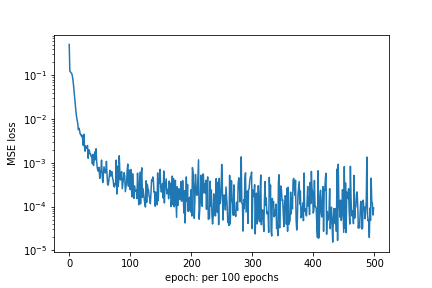

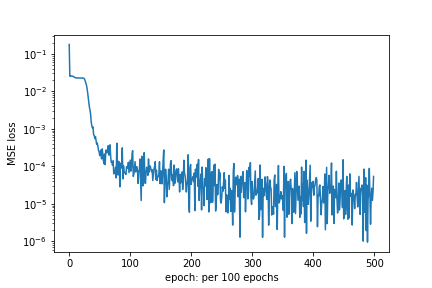

In [10]:
from IPython.display import Image, display

listOfImageNames = ['./loss.png',
                    './loss_multiscale.png']

for imageName in listOfImageNames:
    display(Image(filename=imageName))

## Check the reconstruction. 

### No visual difference for those values at 0-level

- But that does not mean the derivative will be nicely reconstructed

In [12]:
u_ng = model_opt_ng.predict(train_data[:,:2])[:,0].reshape(10,200)
u_wg = model_opt.predict(train_data[:,:2])[:,0].reshape(10,200)

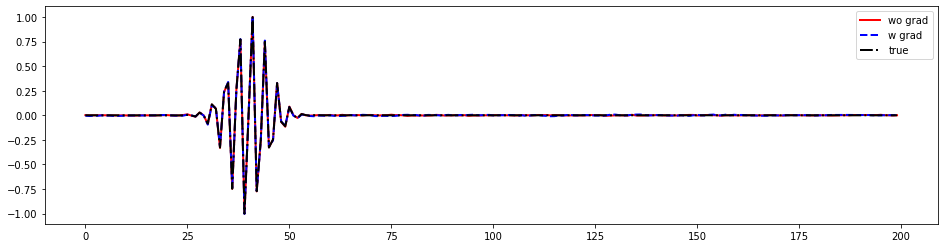

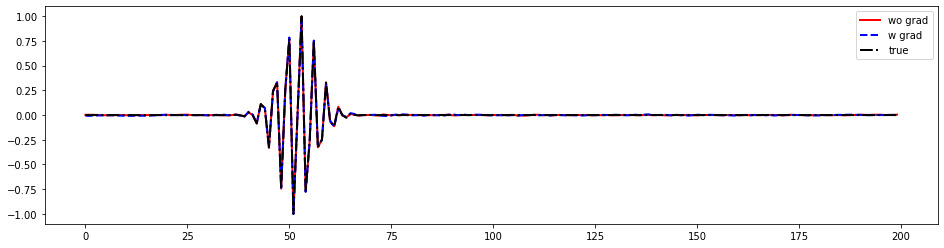

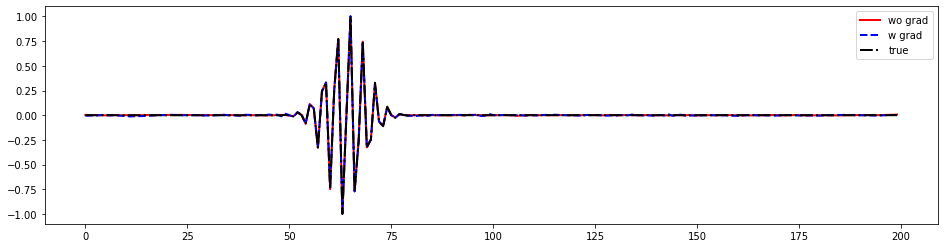

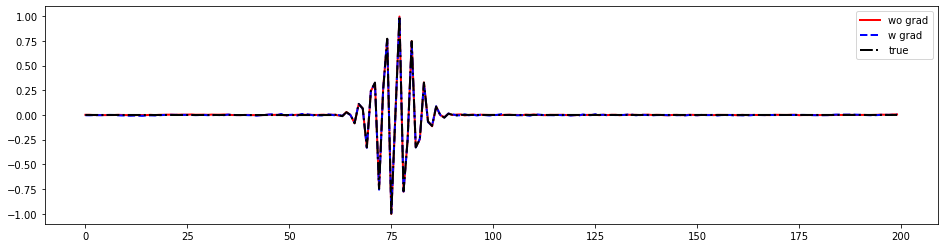

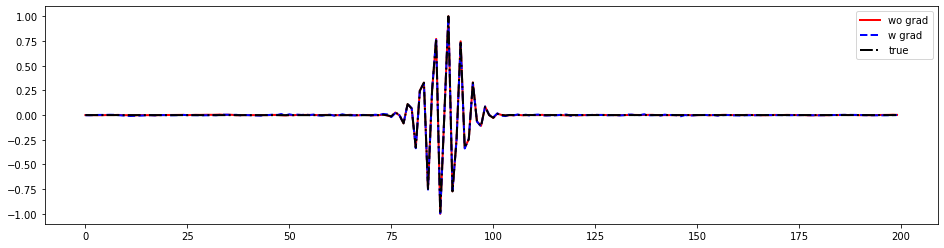

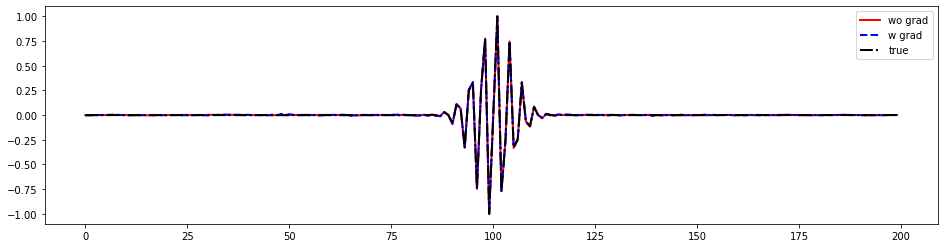

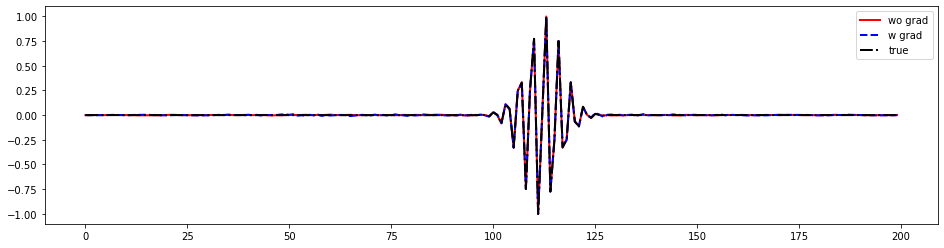

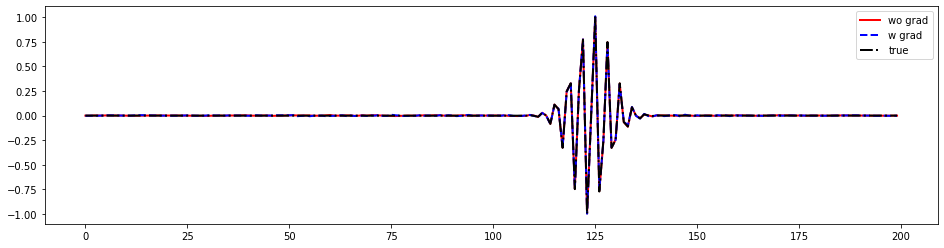

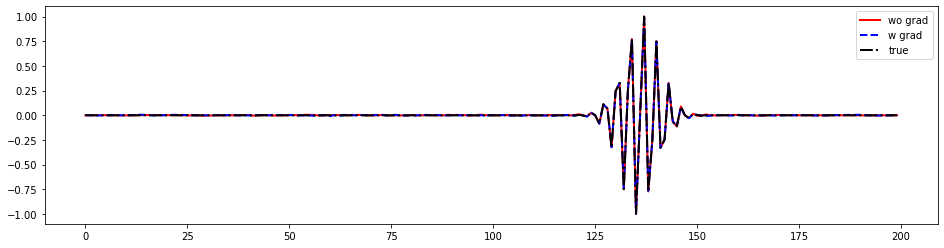

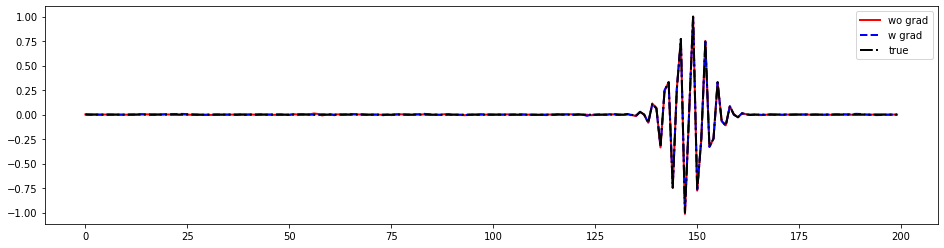

In [13]:
for i in range(10):
    plt.figure(figsize=(16,4))
    plt.plot(u_ng[i],'r-',lw=2,label='wo grad')
    plt.plot(u_wg[i],'b--',lw=2,label='w grad')
    plt.plot(train_data[:,2].reshape(10,200)[i],'k-.',lw=2,label='true')
    plt.legend(loc='best')

### Major differences in 1-level: the derivatives

In [14]:
dudt_ng = model_opt_ng.predict(train_data[:,:2])[:,1].reshape(10,200)
dudx_ng = model_opt_ng.predict(train_data[:,:2])[:,2].reshape(10,200)
dudt_wg = model_opt.predict(train_data[:,:2])[:,1].reshape(10,200)
dudx_wg = model_opt.predict(train_data[:,:2])[:,2].reshape(10,200)

### Neither fits du/dt well

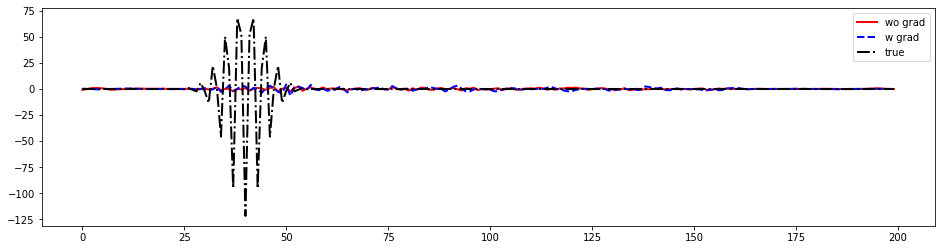

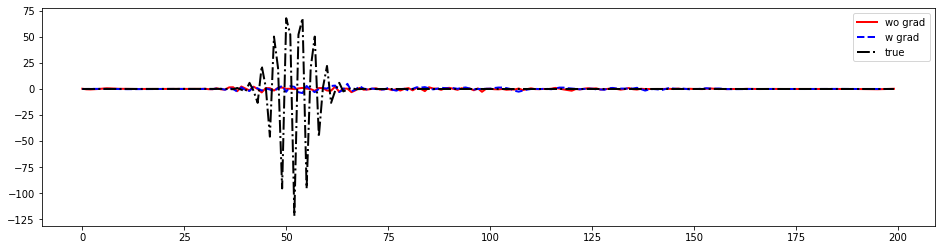

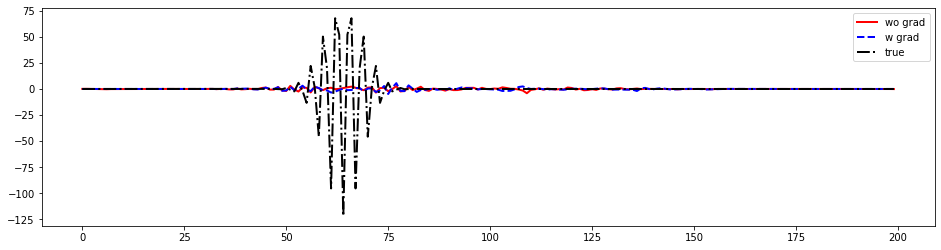

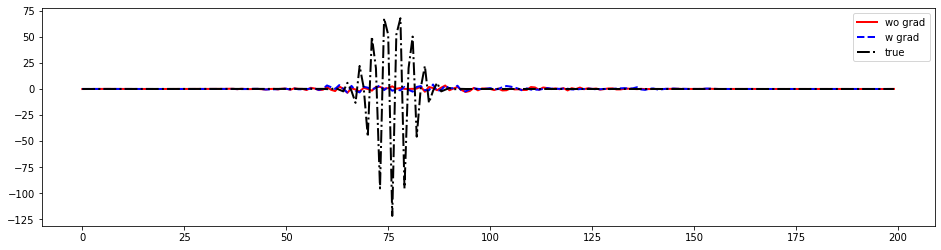

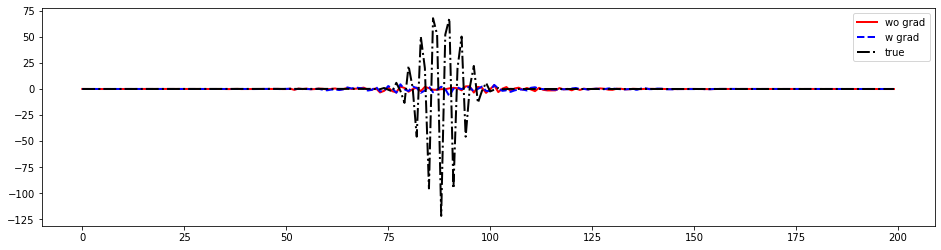

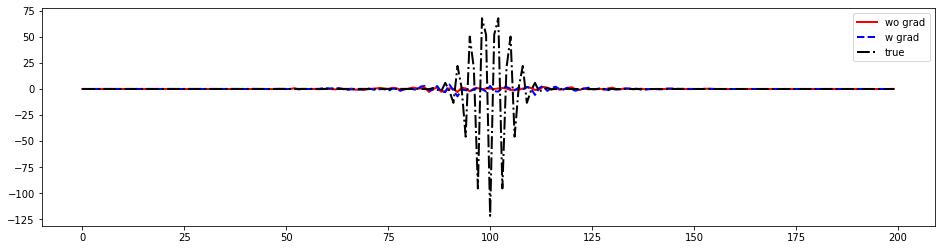

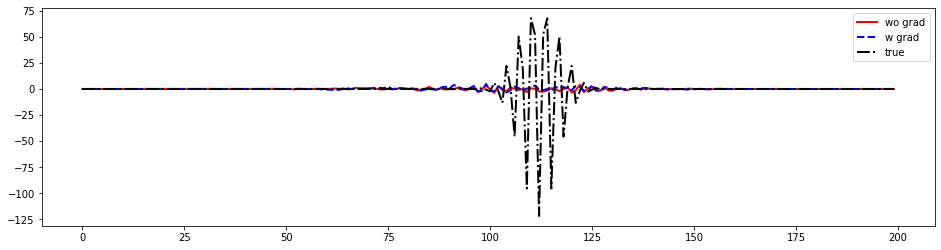

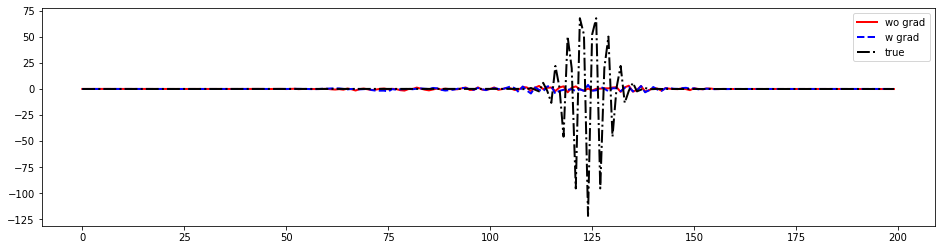

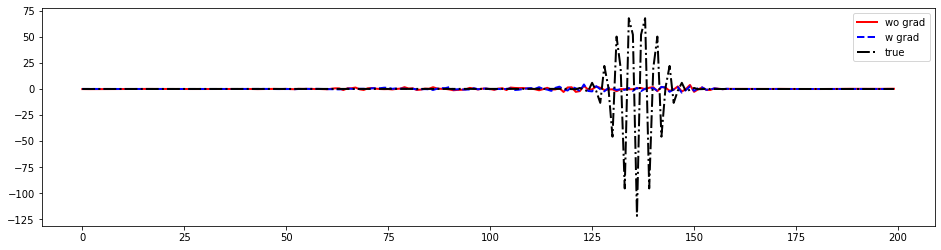

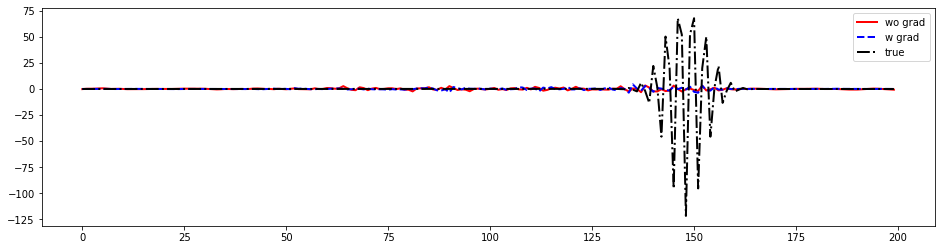

In [15]:
for i in range(10):
    plt.figure(figsize=(16,4))
    plt.plot(dudt_ng[i],'r-',lw=2,label='wo grad')
    plt.plot(dudt_wg[i],'b--',lw=2,label='w grad')
    plt.plot(train_data[:,3].reshape(10,200)[i],'k-.',lw=2,label='true')
    plt.legend(loc='best')

### But the first one fits du/dx well, and you can see if not regularized, the prediction on du/dx can be wild even though 0-level is well-fitted.

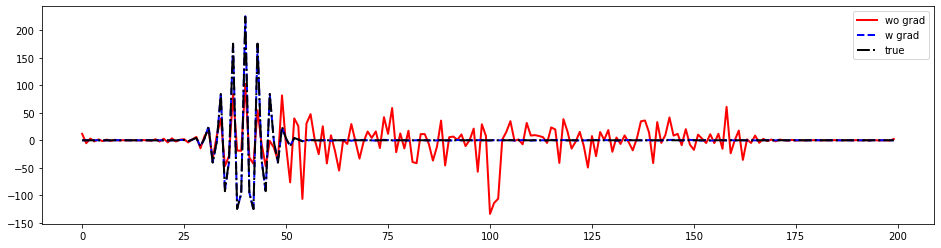

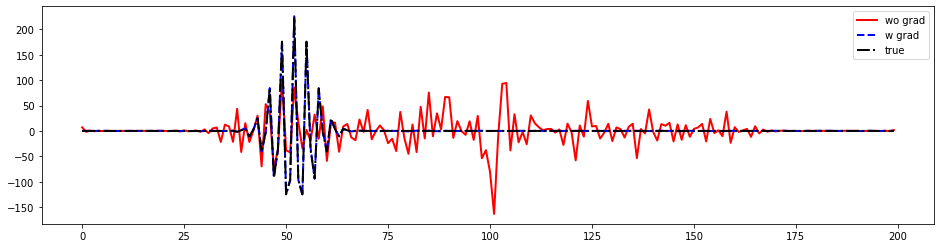

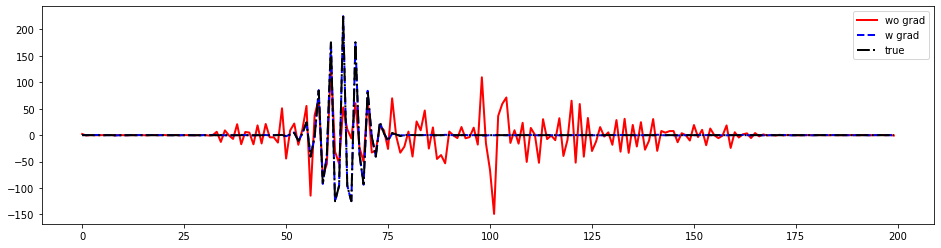

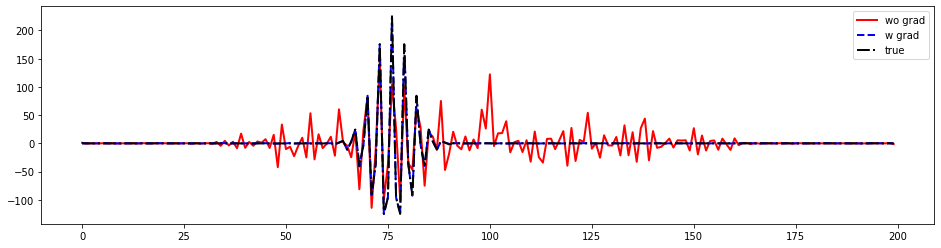

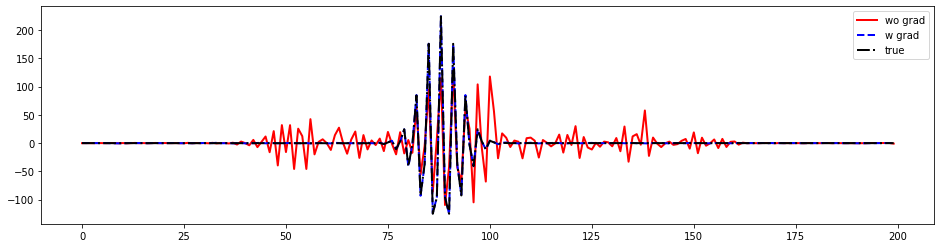

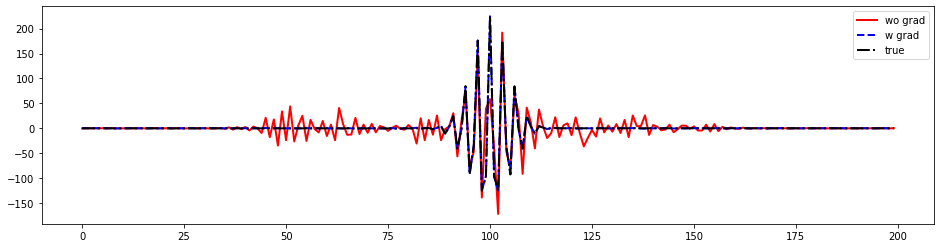

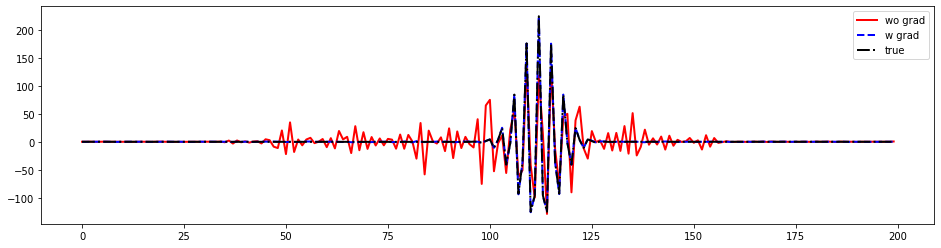

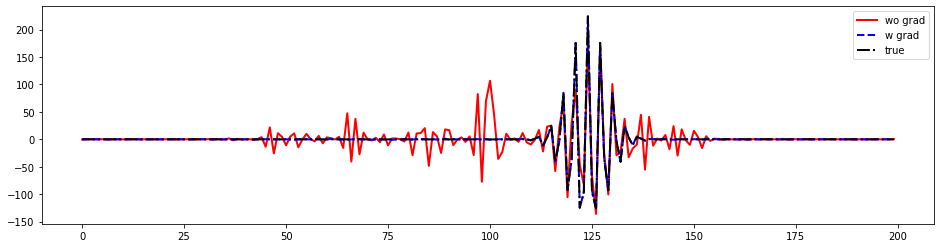

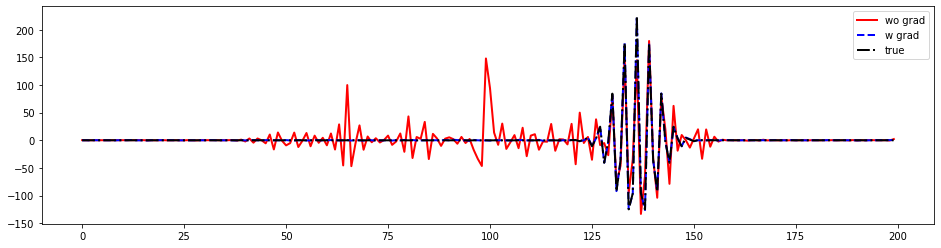

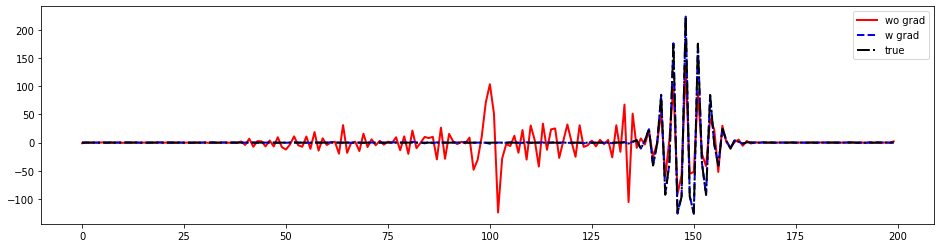

In [16]:
for i in range(10):
    plt.figure(figsize=(16,4))
    plt.plot(dudx_ng[i],'r-',lw=2,label='wo grad')
    plt.plot(dudx_wg[i],'b--',lw=2,label='w grad')
    plt.plot(train_data[:,4].reshape(10,200)[i],'k-.',lw=2,label='true')
    plt.legend(loc='best')

# Now we turn attention to super-resolution

- let's sample 800 points in space (note in the training data only 200 points in space)

In [17]:
x_new_res = 800

test_x = np.linspace(0,1,x_new_res,endpoint=False)
test_t = np.linspace(0,100,10,endpoint=False)

test_xx, test_tt = np.meshgrid(test_x, test_t)
u_test = np.exp(-1000*(test_xx-x0-c*test_tt)**2)*np.sin(omega*(test_xx-x0-c*test_tt))


test_xx_n = (test_xx-tw.mean[1])/tw.std[1]
test_tt_n = (test_tt-tw.mean[0])/tw.std[0]


test_data = np.vstack([test_tt_n.flatten(), test_xx_n.flatten()]).T

In [18]:
u_ng_test = model_opt_ng.predict(test_data)[:,0].reshape(10,x_new_res)
u_wg_test = model_opt.predict(test_data)[:,0].reshape(10,x_new_res)

### Super-resolution will show a lot of spurious waves - which can be alleivated by Solobov training

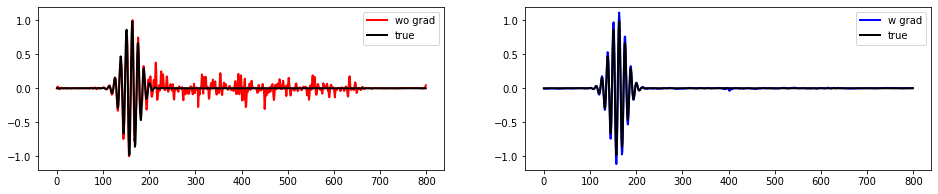

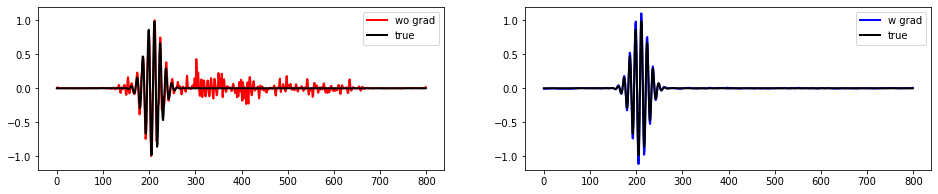

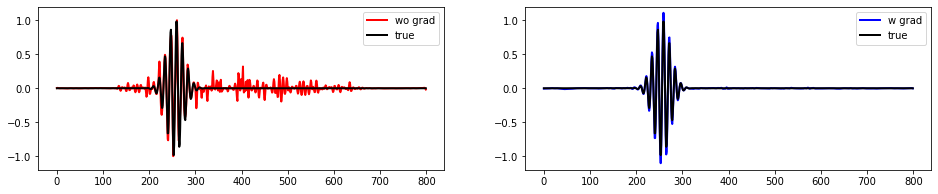

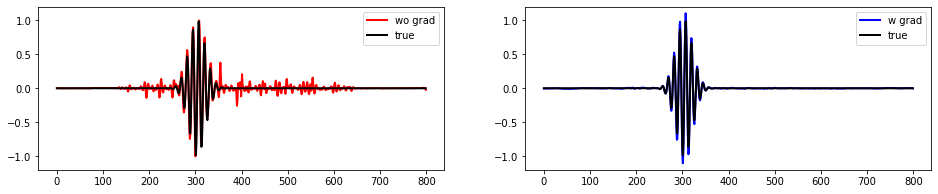

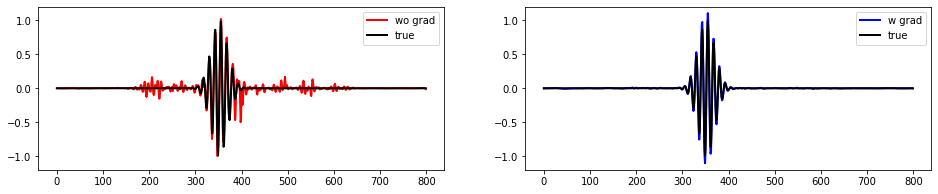

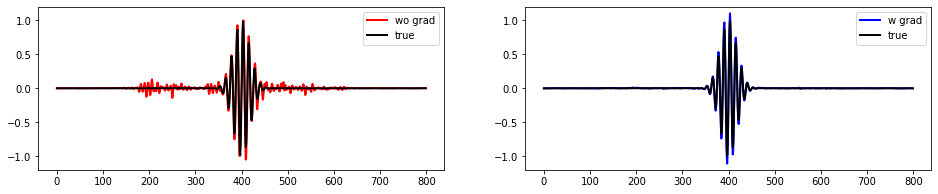

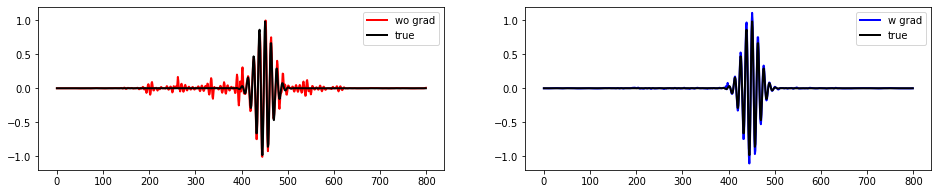

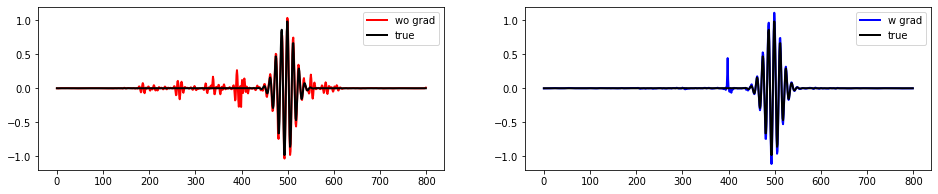

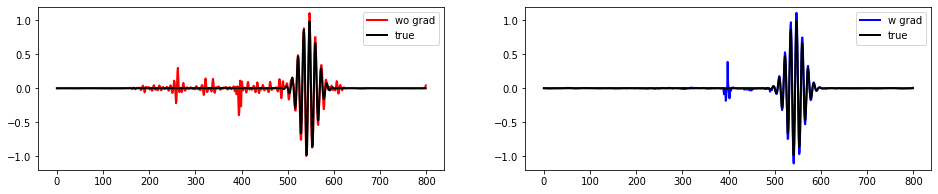

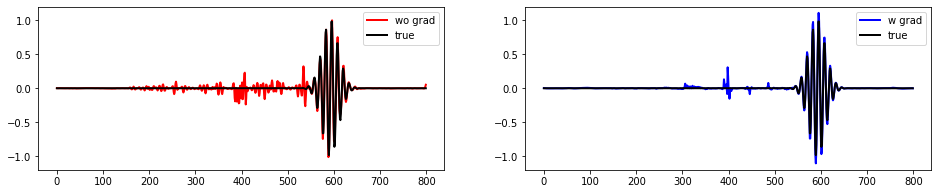

In [19]:
for i in range(10):
    fig,axs=plt.subplots(1,2,figsize=(16,3))
    # plt.figure(figsize=(12,3))
    axs[0].plot(u_ng_test[i],'r-',lw=2,label='wo grad')
    axs[0].plot(u_test[i],'k-',lw=2,label='true')
    axs[0].legend(loc='best')
    axs[0].set_ylim([-1.2,1.2])
    
    axs[1].plot(u_wg_test[i],'b-',lw=2,label='w grad')
    axs[1].plot(u_test[i],'k-',lw=2,label='true')
    axs[1].legend(loc='best')
    axs[1].set_ylim([-1.2,1.2])

# Conclusion 

- Original SIREN work leads to undesireable super-resolution spurious wave issues

- Regularizing with gradient information can help spurious high wave signal in super resolution

- It is very easy to implement in `nif`